In [1]:
import numpy as np
import os
import sys
import scipy.io
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
import tensorflow.keras.preprocessing.image as process_im
import pprint
import IPython.display
import cv2
import csv

In [3]:
pp = pprint.PrettyPrinter(indent=4)
resnet = tf.keras.applications.resnet50.ResNet50(include_top=False, weights= 'imagenet')

resnet.trainable = False
pp.pprint(resnet)

94765736/94765736 [==============================] - 28s 0us/step


In [4]:
content_img_path = 'WhatsApp Image 2023-03-01 at 17.21.44.jpg'
style_img_path = 'city-buildings-cartoon-vector-22896067.jpg'

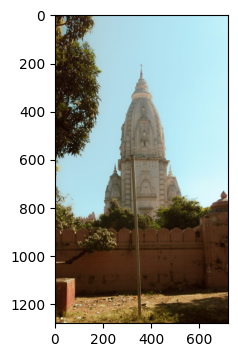

In [5]:
plt.figure(figsize=(6,4))
img = load_img(content_img_path)
plt.imshow(img)
plt.show()

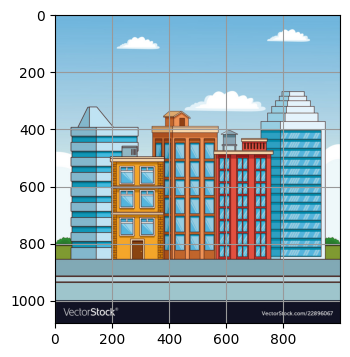

In [6]:
plt.figure(figsize=(6,4))
img = load_img(style_img_path)
plt.imshow(img)
plt.grid(color='#999999', linestyle='-')
plt.show()

In [7]:
def load_file(img_path):
    image =  Image.open(img_path)
    max_dim=512
    factor=max_dim/max(image.size)
    image=image.resize((round(image.size[0]*factor),round(image.size[1]*factor)),Image.ANTIALIAS)
    im_array = process_im.img_to_array(image)
    im_array = np.expand_dims(im_array,axis=0)
    return im_array

In [8]:
def img_preprocess(img_path):
    image = load_file(img_path)
    img = tf.keras.applications.vgg19.preprocess_input(image)
    return img

In [9]:
def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x,0)
    assert len(x.shape) == 3
    x[ :, :, 0] += 85
    x[ :, :, 1] += 90
    x[ :, :, 2] += 100
    x = np.clip(x , 0, 255).astype('uint8')
    return x

In [10]:
for layer in resnet.layers:
    print(layer.name)

input_1
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn
conv3_

In [34]:
content_layers = ['conv5_block1_1_conv'
,'conv5_block1_1_bn'
,'conv5_block1_1_relu'
,'conv5_block1_2_conv'
,'conv5_block1_2_bn'
,'conv5_block1_2_relu'
,'conv5_block1_0_conv'
,'conv5_block1_3_conv'
,'conv5_block1_0_bn'
,'conv5_block1_3_bn'
,'conv5_block1_add'
,'conv5_block1_out'
,'conv5_block2_1_conv'
,'conv5_block2_1_bn'
,'conv5_block2_1_relu'
,'conv5_block2_2_conv'
,'conv5_block2_2_bn'
,'conv5_block2_2_relu'
,'conv5_block2_3_conv'
,'conv5_block2_3_bn'
,'conv5_block2_add'
,'conv5_block2_out'
,'conv5_block3_1_conv'
,'conv5_block3_1_bn'
,'conv5_block3_1_relu'
,'conv5_block3_2_conv'
,'conv5_block3_2_bn'
,'conv5_block3_2_relu'
,'conv5_block3_3_conv'
,'conv5_block3_3_bn'
,'conv5_block3_add']

In [35]:
style_layers = ['conv2_block1_2_conv'
,'conv2_block1_2_bn'
,'conv2_block1_2_relu'
,'conv2_block1_0_conv'
,'conv2_block1_3_conv'
,'conv2_block1_0_bn'
,'conv2_block1_3_bn'
,'conv2_block1_add'
,'conv2_block1_out'
,'conv2_block2_1_conv'
,'conv2_block2_1_bn'
,'conv2_block2_1_relu'
,'conv2_block2_2_conv'
,'conv2_block2_2_bn'
,'conv2_block2_2_relu'
,'conv2_block2_3_conv'
,'conv2_block2_3_bn'
,'conv2_block2_add'
,'conv2_block2_out'
,'conv2_block3_1_conv'
,'conv2_block3_1_bn'
,'conv2_block3_1_relu'
,'conv2_block3_2_conv'
,'conv2_block3_2_bn'
,'conv2_block3_2_relu'
,'conv2_block3_3_conv'
,'conv2_block3_3_bn'
,'conv2_block3_add'
,'conv2_block3_out']

In [13]:
def get_model():
    content_output = [resnet.get_layer(layer).output for layer in content_layers]
    style_output = [resnet.get_layer(layer).output for layer in style_layers]
    model_output = content_output + style_output
    return Model(resnet.input, model_output)

In [14]:
resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                        

                                                                                                  
 conv2_block2_add (Add)         (None, None, None,   0           ['conv2_block1_out[0][0]',       
                                256)                              'conv2_block2_3_bn[0][0]']      
                                                                                                  
 conv2_block2_out (Activation)  (None, None, None,   0           ['conv2_block2_add[0][0]']       
                                256)                                                              
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, None, None,   16448       ['conv2_block2_out[0][0]']       
                                64)                                                               
                                                                                                  
 conv2_blo

                                128)                                                              
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_2_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, None, None,   0          ['conv3_block2_2_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, None, None,   66048       ['conv3_block2_2_relu[0][0]']    
                                512)                                                              
          

 conv4_block1_1_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_1_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, None, None,   0          ['conv4_block1_1_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block1_2_conv (Conv2D)   (None, None, None,   590080      ['conv4_block1_1_relu[0][0]']    
                                256)                                                              
                                                                                                  
 conv4_block1_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_2_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block3_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block3_3_conv[0][0]']    
 ization)                       1024)                                                             
                                                                                                  
 conv4_block3_add (Add)         (None, None, None,   0           ['conv4_block2_out[0][0]',       
                                1024)                             'conv4_block3_3_bn[0][0]']      
                                                                                                  
 conv4_block3_out (Activation)  (None, None, None,   0           ['conv4_block3_add[0][0]']       
                                1024)                                                             
                                                                                                  
 conv4_blo

 ization)                       256)                                                              
                                                                                                  
 conv4_block6_2_relu (Activatio  (None, None, None,   0          ['conv4_block6_2_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block6_3_conv (Conv2D)   (None, None, None,   263168      ['conv4_block6_2_relu[0][0]']    
                                1024)                                                             
                                                                                                  
 conv4_block6_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block6_3_conv[0][0]']    
 ization)                       1024)                                                             
          

 conv5_block3_1_conv (Conv2D)   (None, None, None,   1049088     ['conv5_block2_out[0][0]']       
                                512)                                                              
                                                                                                  
 conv5_block3_1_bn (BatchNormal  (None, None, None,   2048       ['conv5_block3_1_conv[0][0]']    
 ization)                       512)                                                              
                                                                                                  
 conv5_block3_1_relu (Activatio  (None, None, None,   0          ['conv5_block3_1_bn[0][0]']      
 n)                             512)                                                              
                                                                                                  
 conv5_block3_2_conv (Conv2D)   (None, None, None,   2359808     ['conv5_block3_1_relu[0][0]']    
          

In [15]:
model =get_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

                                                                                                  
 conv2_block2_add (Add)         (None, None, None,   0           ['conv2_block1_out[0][0]',       
                                256)                              'conv2_block2_3_bn[0][0]']      
                                                                                                  
 conv2_block2_out (Activation)  (None, None, None,   0           ['conv2_block2_add[0][0]']       
                                256)                                                              
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, None, None,   16448       ['conv2_block2_out[0][0]']       
                                64)                                                               
                                                                                                  
 conv2_blo

                                128)                                                              
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_2_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, None, None,   0          ['conv3_block2_2_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, None, None,   66048       ['conv3_block2_2_relu[0][0]']    
                                512)                                                              
          

 conv4_block1_1_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_1_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, None, None,   0          ['conv4_block1_1_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block1_2_conv (Conv2D)   (None, None, None,   590080      ['conv4_block1_1_relu[0][0]']    
                                256)                                                              
                                                                                                  
 conv4_block1_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_2_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block3_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block3_3_conv[0][0]']    
 ization)                       1024)                                                             
                                                                                                  
 conv4_block3_add (Add)         (None, None, None,   0           ['conv4_block2_out[0][0]',       
                                1024)                             'conv4_block3_3_bn[0][0]']      
                                                                                                  
 conv4_block3_out (Activation)  (None, None, None,   0           ['conv4_block3_add[0][0]']       
                                1024)                                                             
                                                                                                  
 conv4_blo

 ization)                       256)                                                              
                                                                                                  
 conv4_block6_2_relu (Activatio  (None, None, None,   0          ['conv4_block6_2_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block6_3_conv (Conv2D)   (None, None, None,   263168      ['conv4_block6_2_relu[0][0]']    
                                1024)                                                             
                                                                                                  
 conv4_block6_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block6_3_conv[0][0]']    
 ization)                       1024)                                                             
          

 conv5_block3_1_conv (Conv2D)   (None, None, None,   1049088     ['conv5_block2_out[0][0]']       
                                512)                                                              
                                                                                                  
 conv5_block3_1_bn (BatchNormal  (None, None, None,   2048       ['conv5_block3_1_conv[0][0]']    
 ization)                       512)                                                              
                                                                                                  
 conv5_block3_1_relu (Activatio  (None, None, None,   0          ['conv5_block3_1_bn[0][0]']      
 n)                             512)                                                              
                                                                                                  
 conv5_block3_2_conv (Conv2D)   (None, None, None,   2359808     ['conv5_block3_1_relu[0][0]']    
          

In [16]:
content_img = load_file(content_img_path)
content_img.shape

C:\Users\adity\AppData\Local\Temp\ipykernel_6104\496935215.py:5: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image=image.resize((round(image.size[0]*factor),round(image.size[1]*factor)),Image.ANTIALIAS)


(1, 512, 288, 3)

In [17]:
style_img = load_file(style_img_path)
style_img.shape

C:\Users\adity\AppData\Local\Temp\ipykernel_6104\496935215.py:5: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image=image.resize((round(image.size[0]*factor),round(image.size[1]*factor)),Image.ANTIALIAS)


(1, 512, 474, 3)

In [18]:
def get_content_loss(generated_img, content_img):
    content_loss = tf.reduce_sum(tf.square(content_img - generated_img))/(4*512*288*3)
    return content_loss

In [19]:
def gram_matrix(tensor):
    channels = int(tensor.shape[-1])
    vector = tf.reshape(tensor, [-1, channels])
    n =tf.shape(vector)[0]
    gram_matrix = tf.matmul(vector,vector, transpose_a = True)
    return gram_matrix/tf.cast(n, tf.float32)

In [20]:
def get_style_loss(generated_img, style_img):
    gram_noise = gram_matrix(generated_img)
    style_loss = tf.reduce_mean(tf.square(style_img - gram_noise))
    return style_loss

In [21]:
def get_features(model, content_img_path, style_img_path):
    content_img = img_preprocess(content_img_path)
    style_img = img_preprocess(style_img_path)
    
    content_output = model(content_img)
    style_output = model(style_img)
    
    content_feature = [layer[0] for layer in content_output[len(style_layers):]]
    style_feature = [layer[0] for layer in style_output[:len(style_layers)]]
    return content_feature, style_feature

In [22]:
def compute_loss(model, loss_weights, image, gram_style_features, content_features):
    beta, alpha = loss_weights
    output = model(image)
    content_loss = 0
    style_loss = 0
    
    generated_img_style_feature = output[:len(style_layers)]
    generated_img_content_feature = output[len(style_layers):]
    
    alpha_per_layer = 1.0/float(len(content_layers))
    for a,b in zip(generated_img_content_feature, content_features):
        content_loss += alpha_per_layer*get_content_loss(a[0],b)
    
    beta_per_layer = 1.0/float(len(style_layers))
    for a,b in zip(gram_style_features, generated_img_style_feature):
        style_loss += beta_per_layer*get_style_loss(b[0], a)
    
    style_loss *= beta
    content_loss *= alpha
    
    total_loss = content_loss + style_loss
    
    return total_loss, content_loss, style_loss

In [23]:
def compute_grads(dictionary):
    with tf.GradientTape() as tape:
        all_losses = compute_loss(**dictionary)
    total_loss = all_losses[0]
    y = tape.gradient(total_loss, dictionary['image'])
    return y, all_losses

In [24]:
def style_transfer(content_img_path, style_img_path, epochs = 500, alpha =20, beta = 1e-32):
    model = get_model()
    
    for layer in model.layers:
        layer.trainable = False
    
    content_feature, style_feature = get_features(model, content_img_path, style_img_path)
    
    style_gram_matrix = [gram_matrix(feature) for feature in style_feature]
    
    generated_img = img_preprocess(content_img_path)
    generated_img = tf.Variable(generated_img, tf.float32)
    
    optimizer = Adam(learning_rate = 5, beta_1 = 0.99, epsilon = 1e-1)
    
    best_loss, best_img = 0.5, None
    
    loss_weights = (alpha, beta)
    dictionary = {'model' : model,
                 'loss_weights' : loss_weights,
                 'image' : generated_img,
                 'gram_style_features' : style_gram_matrix,
                 'content_features' : content_feature}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    
    min_vals = -norm_means
    max_vals = 255 - norm_means
    
    imgs = []
    with open('ResNet50 logs.csv', 'w', newline= '') as file:
        writer = csv.writer(file)
        writer.writerow(['Epochs', 'Total_Loss', 'Content_Loss', 'Style_Loss'])
        for i in range(0,epochs):
            grad, all_losses = compute_grads(dictionary)
            total_loss, content_loss, style_loss = all_losses
            optimizer.apply_gradients([(grad, generated_img)])
            clipped = tf.clip_by_value(generated_img, min_vals, max_vals)
            generated_img.assign(clipped)

            if total_loss<best_loss:
                best_loss = total_loss
                best_img = deprocess_img(generated_img.numpy())

            if i%5==0:
                writer.writerow([i, float(total_loss/10**5), float(content_loss/10**5), float(style_loss/10**5)])
                plot_img = generated_img.numpy()
                plot_img = deprocess_img(plot_img)
                plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB)
                imgs.append(plot_img)
                IPython.display.clear_output(wait=True)
                IPython.display.display_png(Image.fromarray(plot_img))
                print('Epoch: {}'.format(i))        
                print('Total loss: {:.4e}, ' 
                  'style loss: {:.4e}, '
                  'content loss: {:.4e}, '.format(total_loss, style_loss, content_loss))
            IPython.display.clear_output(wait=True)

    return best_img, best_loss, imgs

In [36]:
best_img, best_loss, imgs = style_transfer(content_img_path, style_img_path, epochs=500)

In [37]:
len(imgs)

100

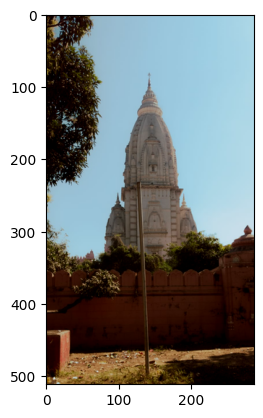

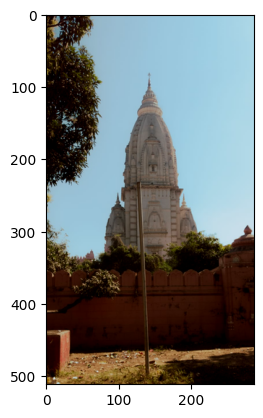

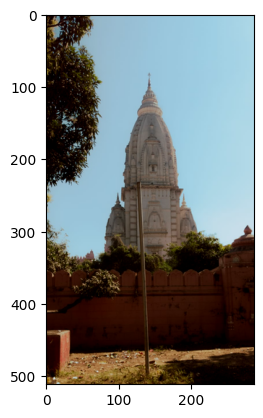

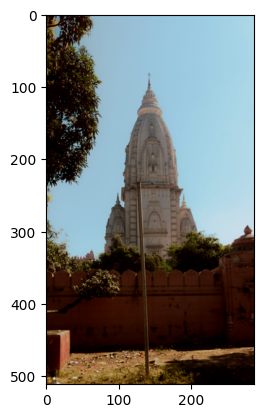

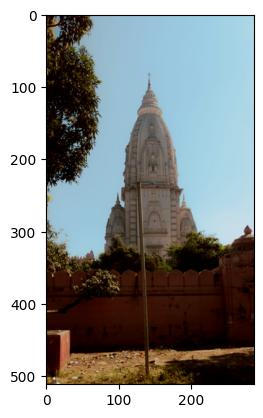

...

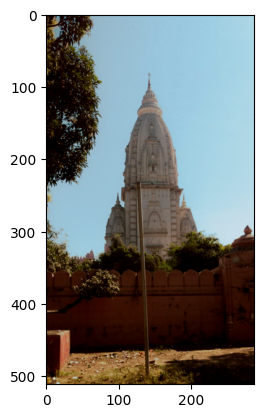

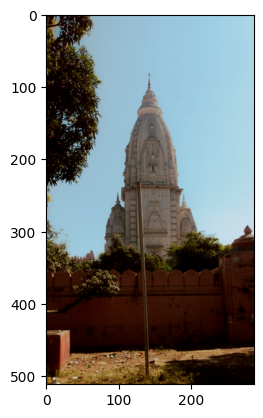

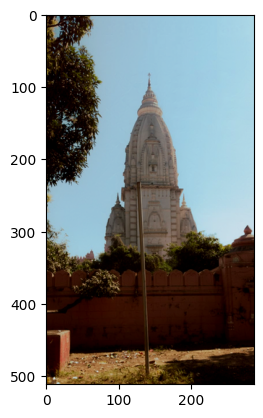

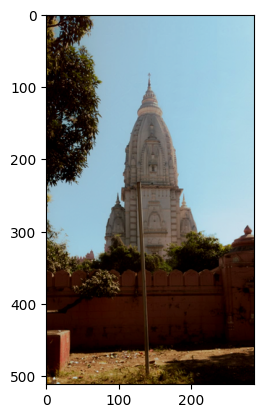

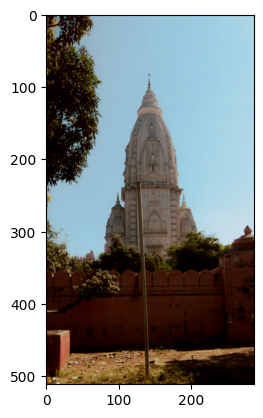

In [38]:
for i in imgs:
    plt.imshow(i)
    plt.show()

In [39]:
import pandas as pd
logs = pd.read_csv(r'ResNet50 logs.csv')

In [40]:
logs

,Epochs,Total_Loss,Content_Loss,Style_Loss
0,0,0.000473,0.0,0.000473
1,5,0.000471,0.0,0.000471
2,10,0.000467,0.0,0.000467
3,15,0.000463,0.0,0.000463
4,20,0.000458,0.0,0.000458
...,...,...,...,...
95,475,0.000262,0.0,0.000262
96,480,0.000261,0.0,0.000261
97,485,0.000260,0.0,0.000260
98,490,0.000259,0.0,0.000259


In [41]:
logs = pd.DataFrame(logs)

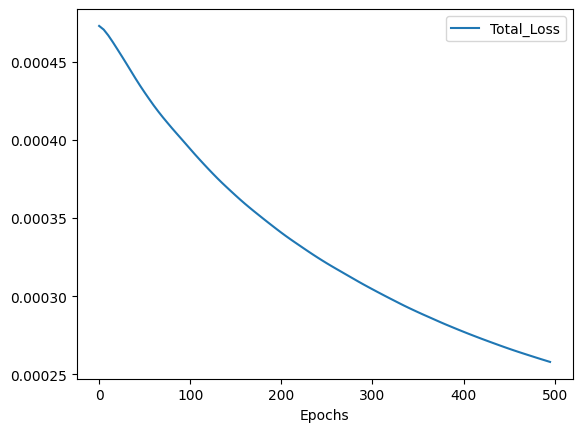

In [42]:
logs.plot(x = 'Epochs', y = 'Total_Loss', kind = 'line')
plt.show()

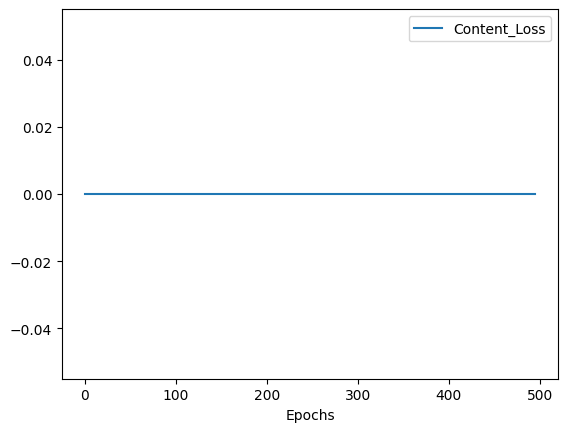

In [43]:
logs.plot(x = 'Epochs', y = 'Content_Loss', kind = 'line')
plt.show()

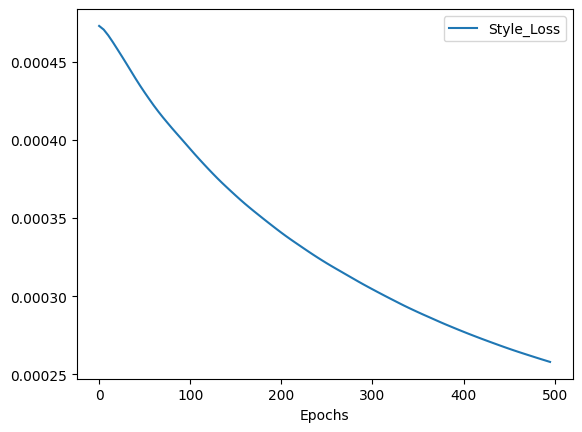

In [44]:
logs.plot(x = 'Epochs', y = 'Style_Loss', kind = 'line')
plt.show()

In [ ]:
def driver_fn(content_img_path, style_img_path, epochs, alpha =20, beta = 1e-32):
    model = get_model()
    
    for layer in model.layers:
        layer.trainable = False
    
    content_feature, style_feature = get_features(model, content_img_path, style_img_path)
    
    style_gram_matrix = [gram_matrix(feature) for feature in style_feature]
    
    generated_img = img_preprocess(content_img_path)
    generated_img = tf.Variable(generated_img, tf.float32)
    
    optimizer = Adam(learning_rate = 5, beta_1 = 0.99, epsilon = 1e-1)
    
    best_loss, best_img = 0.5, None
    
    loss_weights = (alpha, beta)
    dictionary = {'model' : model,
                 'loss_weights' : loss_weights,
                 'image' : generated_img,
                 'gram_style_features' : style_gram_matrix,
                 'content_features' : content_feature}
    
    norm_means = np.array([103.939, 116.779, 123.68])
    
    min_vals = -norm_means
    max_vals = 255 - norm_means
    
    imgs = []
   
    for i in range(0,epochs):
        grad, all_losses = compute_grads(dictionary)
        total_loss, content_loss, style_loss = all_losses
        optimizer.apply_gradients([(grad, generated_img)])
        clipped = tf.clip_by_value(generated_img, min_vals, max_vals)
        generated_img.assign(clipped)

        if total_loss<best_loss:
            best_loss = total_loss
            best_img = deprocess_img(generated_img.numpy())
            
        plot_img = generated_img.numpy()
        plot_img = deprocess_img(plot_img)
        plot_img = cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB)
        imgs.append(plot_img)

    return best_img, best_loss, imgs

In [ ]:
import gradio as gr
def transfer(content_path, style_path, steps, content_weight = 20, style_weight = 1e-32):
     best_img, best_loss,images = driver_fn(content_img_path = content_path, style_img_path = style_path, epochs=steps, alpha = content_weight, beta = style_weight)
     image = Image.fromarray(images[len(images) -1])
     return image
ui = gr.Interface(transfer, inputs = ['text', 'text', gr.Slider(0,200), gr.Slider(0, 50), gr.Slider(0, 1)], outputs = 'image')
ui.launch()